<a href="https://colab.research.google.com/github/pierrre2db/Test/blob/main/human_pose_estimation_using_mediapipe_LSTM_Deep_Learning_Model_Copy1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### 1. Import Dependencies

In [ ]:
!pip install mediapipe

In [ ]:
#Import libraries

import cv2 #OpenCV is the library that we will be using for image processing
import mediapipe as mp #To get all pose estimation libraries and solutions
import numpy as np #Contains multidimensional array and matrix data structures and mathematical functions
import matplotlib.pyplot as plt #To create the visualization of plots and charts
import time #Provides various functions for working with time-related operations
import os #It allows to perform tasks sush as creating and deleting files
from google.colab.patches import cv2_imshow

### 2. Create variables

In [ ]:
#Create the model to detect the pose

#Create variables
mpDraw = mp.solutions.drawing_utils #To visualize the pose #For drawing key points
mpPose = mp.solutions.pose #Importing the pose estimation model #Initializing mediapipe pose class
pose = mpPose.Pose()   #Create the model
pTime=0  #Previous time

### 3. Make detection of key points

In [ ]:
#Function to determine the points

def findPosition(frame, results, draw=True):
    #results = pose.process(imgRGB) #To send this image to our model
    if results.pose_landmarks: #To verify if it is detected or not
            mpDraw.draw_landmarks(frame, results.pose_landmarks, mpPose.POSE_CONNECTIONS) #To show connected landmarks
            #print (results.pose_landmarks)
    return frame

In [ ]:
#Function to create a list which contains their coordinates

def getPosition(frame,  results, draw=True):

    #Create a list for landmarks
    lmList = []
    #results = pose.process(imgRGB) #To send this image to our model
    if results.pose_landmarks: #Landmarks contains the cordinates of each points and the visibility
        for id, lm in enumerate(results.pose_landmarks.landmark): #To give the loop count. lm=landmark id=number
            h, w, c = frame.shape #To get dimensions(h height, w width) and the c channel of image
            cx, cy = int(lm.x * w), int(lm.y * h) #To give the exact pixel value and make it in integer
            lmList.append([id, cx, cy]) #The values are appended as a list
            if draw:
                cv2.circle(frame, (cx, cy), 5, (255, 0, 0), cv2.FILLED) #draws the points
    return lmList

### Video path

In [ ]:
#create the dataset
dataset_path = os.listdir ('/content/dataset')
label_types = os.listdir ('/content/dataset')
print (label_types)

['m14.mp4', 'stella.mp4']


###  Main program

texte en italique/content/m14.mp4

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


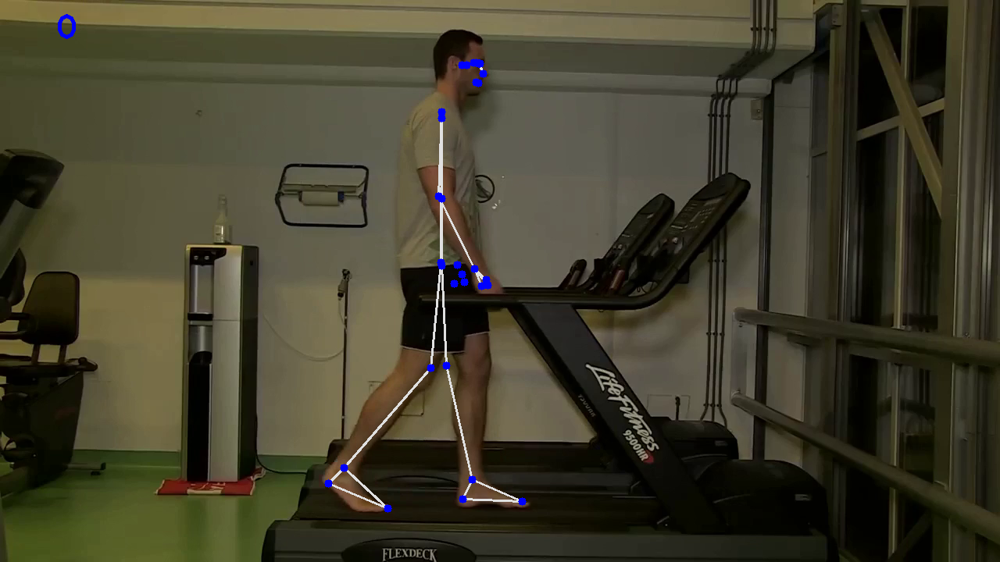

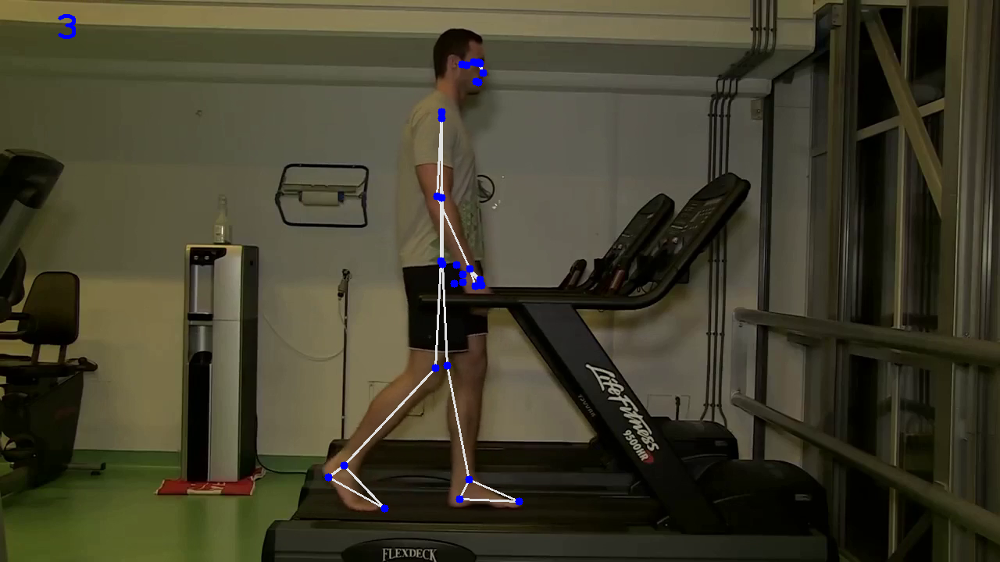

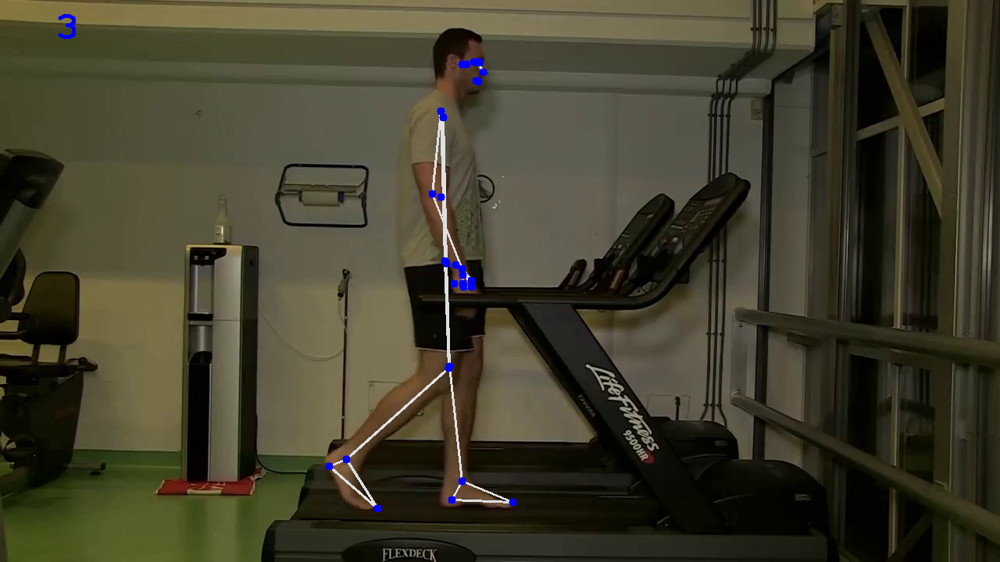

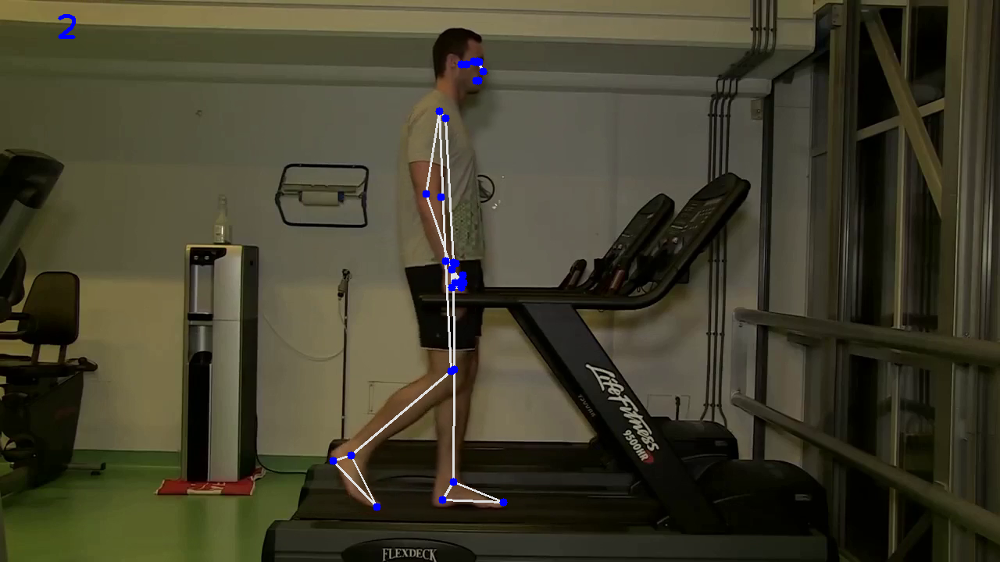

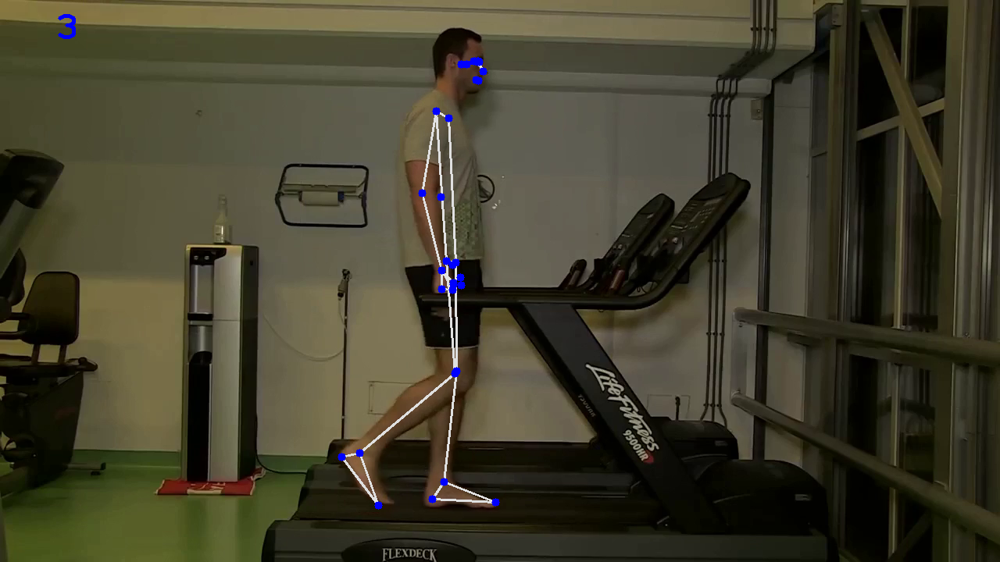

...

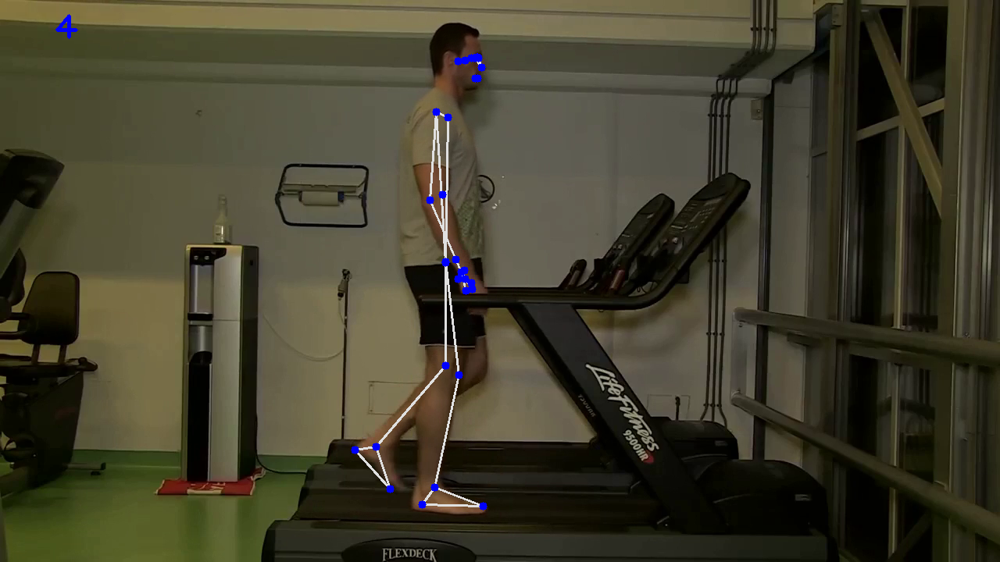

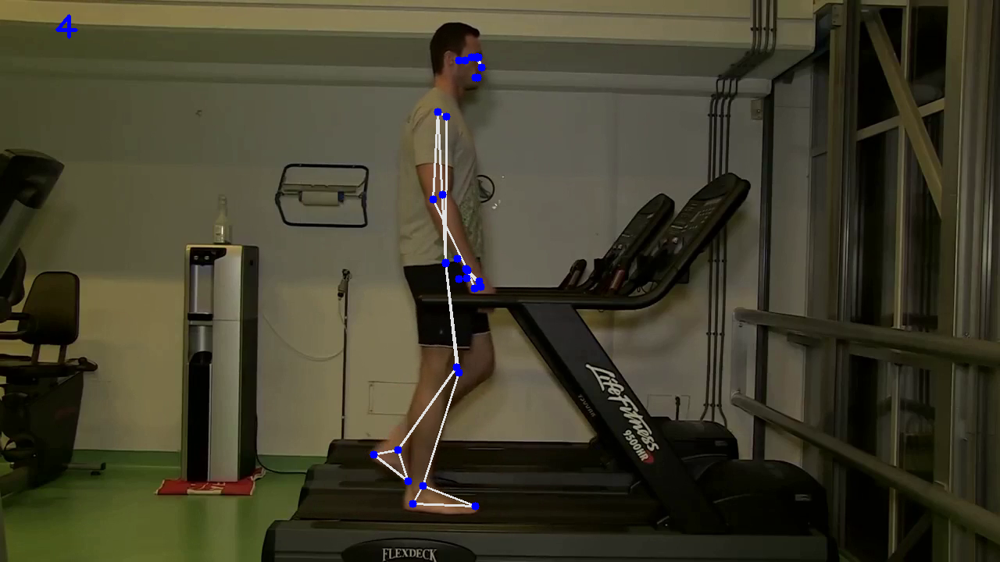

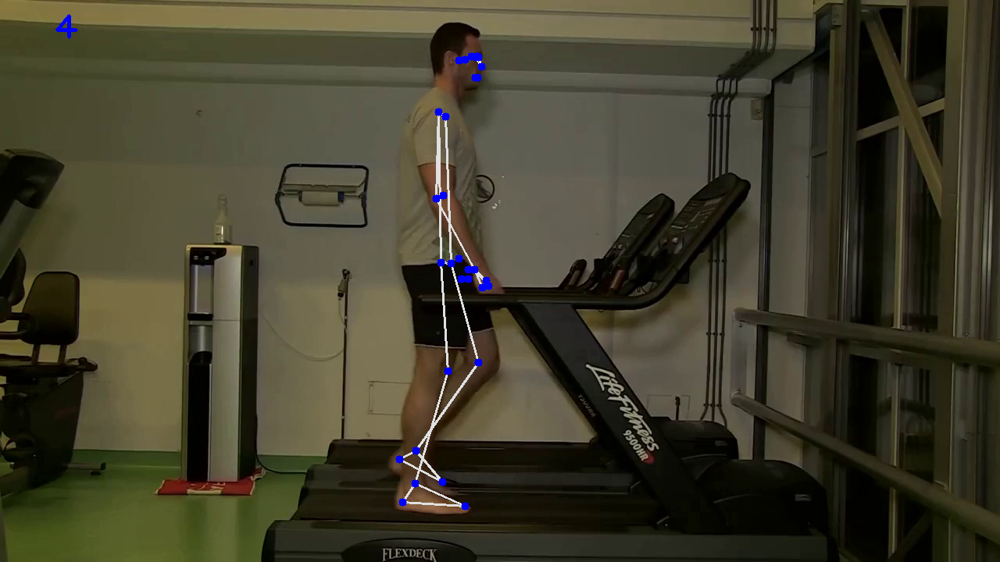

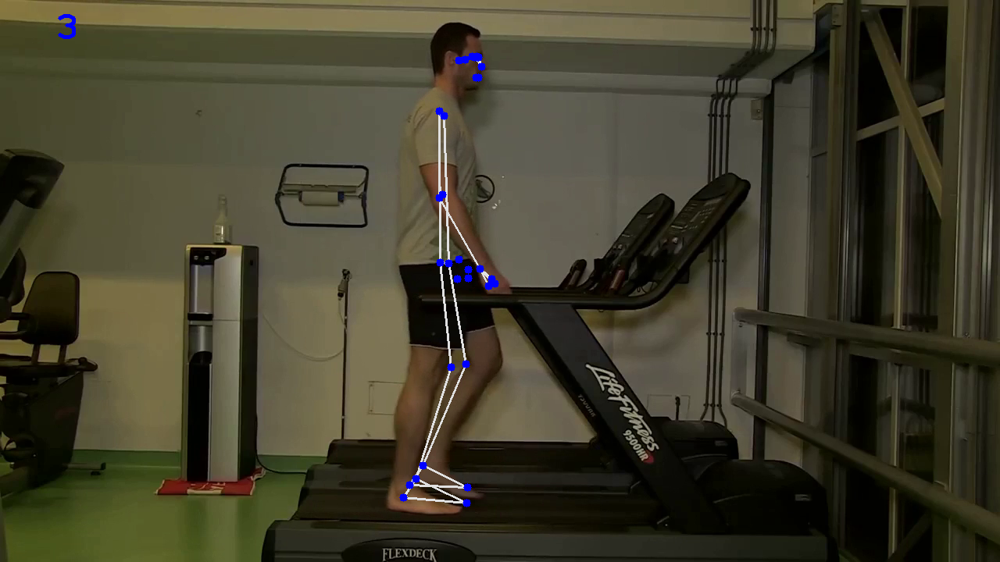

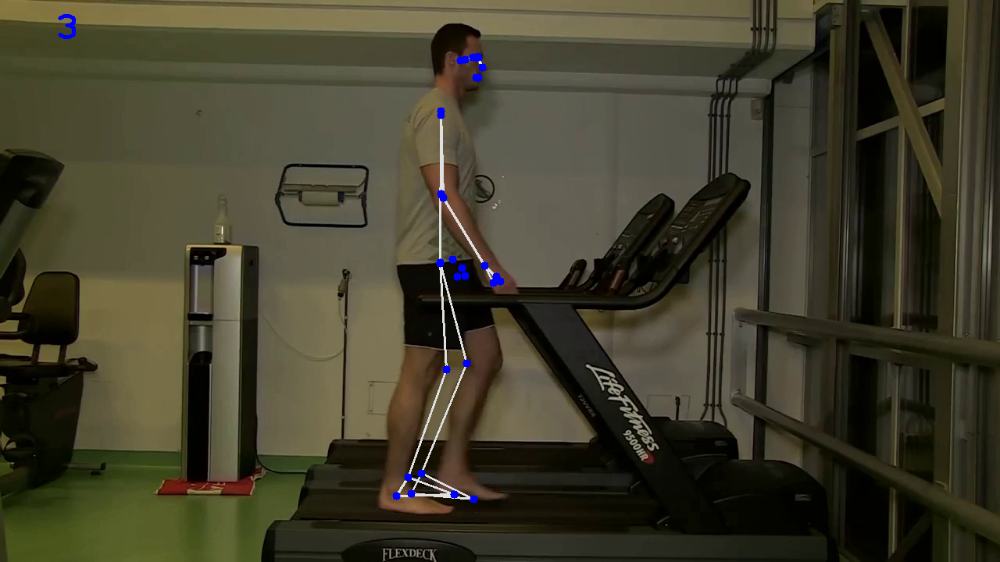

In [ ]:
# List of video files to process
video_files = ["/content/dataset/m14.mp4"]

# Process each video in the list
for video_file in video_files:
   # process_video(video_file)
   # print(results)
   # results.pose_landmarks
   # Create a VideoCapture object and read from the input file
    movie = cv2.VideoCapture(video_file)

    # Check if the video is opened successfully
    opened = movie.isOpened()
    if not opened:
        print(f"Failed to open video: {video_file}")
        #return

    # Get video properties
    fps = int(movie.get(cv2.CAP_PROP_FPS))
    width = int(movie.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(movie.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Define the codec and create a VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(f'output_{video_file}', fourcc, fps, (width, height))

    # Variables to calculate FPS
    pTime = 0

    # Read until the video is completed
    while opened:
        ret, frame = movie.read()
        # If frame is read correctly, ret is True
        if not ret:
            break

        # Calculate the FPS
        cTime = time.time()
        fps = 1 / (cTime - pTime)
        pTime = cTime

        # Get the total number of frames in the video
        total_frames = int(movie.get(cv2.CAP_PROP_FRAME_COUNT))

        # Displaying FPS on the image
        cv2.putText(frame, str(int(fps)), (70, 50), cv2.FONT_HERSHEY_PLAIN, 3, (255, 0, 0), 3)

        # Convert image from BGR to RGB because mediapipe uses only this format RGB
        imgRGB = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Process the frame using mediapipe or any other desired processing
        results = pose.process(imgRGB)  # To send this image to our model

        frame = findPosition(frame, results)  # Pass the 'results' to the function
        lmlist = getPosition(frame, results)

        # Write the frame to the output video
        out.write(frame)

        cv2_imshow(frame)

        # Press 'q' on the keyboard to exit
        if cv2.waitKey(40) == ord('q'):
            break

    # When everything is done, release the video capture and writer objects
    movie.release()
    out.release()

    # Close all the frames
    cv2.destroyAllWindows()


In [ ]:
len(results.pose_landmarks.landmark)

33

In [ ]:
mpPose.POSE_CONNECTIONS??

In [ ]:
frame

In [ ]:
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [ ]:
total_frames

180

### 4. Extract keypoints values

In [ ]:
results

mediapipe.python.solution_base.SolutionOutputs

In [ ]:
results.pose_landmarks.landmark[0].z

-0.10199297964572906

In [ ]:
#Initialize an empty list
pose = []

# Iterate through each pose landmark
for res in results.pose_landmarks.landmark: #It iterates through each individual pose landmark/res is a temporarely variable
    test = np.array([res.x, res.y, res.z, res.visibility]) #It creates a Numpy array composed of 4 values extracted from the 'res'object
    pose.append (test)

In [ ]:
test

array([ 0.49027896,  0.89150131, -0.1133819 ,  0.97747988])

In [ ]:
pose = np.array([[res.x, res.y, res.z, res.visibility] for res in results.pose_landmarks.landmark]).flatten ()
#the pose variable will hold a flattened NumPy array that contains the processed pose landmark data for all detected landmarks.

In [ ]:
pose.shape

(132,)

In [ ]:
def extract_keypoints (results):
    pose = np.array([[res.x, res.y, res.z, res.visibility] for res in results.pose_landmarks.landmark]).flatten ()  if results.pose_landmarks else np.zeros(132)
    return np.concatenate([pose]) #returns a 1D array.
#returns a flattened NumPy array that contains either the processed pose data (if landmarks are detected) or an array of zeros (if no landmarks are detected).
#This function is designed to provide a consistent array format even when pose landmarks are not present.

In [ ]:
extract_keypoints (results)

array([ 0.48935312,  0.12202783, -0.10199298,  0.99955261,  0.48480716,
        0.10445426, -0.08866967,  0.99894488,  0.48409829,  0.10404348,
       -0.08865286,  0.99870408,  0.48321176,  0.10358954, -0.08860187,
        0.99901026,  0.48346037,  0.10451908, -0.12410954,  0.99926829,
        0.48190561,  0.10415933, -0.12414223,  0.9993009 ,  0.48001534,
        0.10374226, -0.1242077 ,  0.99942726,  0.47107705,  0.10900244,
       -0.01005802,  0.99696338,  0.46700484,  0.10969277, -0.16998798,
        0.99943089,  0.48528427,  0.13979915, -0.06799766,  0.99906987,
        0.48381099,  0.13984016, -0.1144828 ,  0.99957532,  0.46130282,
        0.20973803,  0.11433468,  0.9989953 ,  0.44046631,  0.19162212,
       -0.23894331,  0.99997967,  0.46270937,  0.34965172,  0.16132921,
        0.04495832,  0.40976042,  0.33302611, -0.29089519,  0.99186295,
        0.49359393,  0.46520025,  0.09138511,  0.09910338,  0.42196149,
        0.47454333, -0.29756412,  0.96917921,  0.50273532,  0.49

In [ ]:
result_test=extract_keypoints (results)

In [ ]:
result_test.shape

(132,)

In [ ]:
np.save('1', result_test)

In [ ]:
np.load('1.npy')

array([ 0.48935312,  0.12202783, -0.10199298,  0.99955261,  0.48480716,
        0.10445426, -0.08866967,  0.99894488,  0.48409829,  0.10404348,
       -0.08865286,  0.99870408,  0.48321176,  0.10358954, -0.08860187,
        0.99901026,  0.48346037,  0.10451908, -0.12410954,  0.99926829,
        0.48190561,  0.10415933, -0.12414223,  0.9993009 ,  0.48001534,
        0.10374226, -0.1242077 ,  0.99942726,  0.47107705,  0.10900244,
       -0.01005802,  0.99696338,  0.46700484,  0.10969277, -0.16998798,
        0.99943089,  0.48528427,  0.13979915, -0.06799766,  0.99906987,
        0.48381099,  0.13984016, -0.1144828 ,  0.99957532,  0.46130282,
        0.20973803,  0.11433468,  0.9989953 ,  0.44046631,  0.19162212,
       -0.23894331,  0.99997967,  0.46270937,  0.34965172,  0.16132921,
        0.04495832,  0.40976042,  0.33302611, -0.29089519,  0.99186295,
        0.49359393,  0.46520025,  0.09138511,  0.09910338,  0.42196149,
        0.47454333, -0.29756412,  0.96917921,  0.50273532,  0.49

### 5. Setup folders for collection

In [ ]:
# Path for exported data, numpy arrays #sotre the value of the path in the variable DATA_PATH
DATA_PATH = os.path.join('MP1_Data')

# Actions that we try to detect
actions = np.array(['normal', 'abnormal'])

# Thirty videos worth of data
no_sequences = 28

# Videos are going to be 30 frames in length
sequence_length = 28

In [ ]:
#normal
##0
##1
##2
##...
#29
#abnormal

In [ ]:
for action in actions: #This loop is used to create directories for each action.
    for sequence in range(no_sequences): #to create subdirectories under each action directory
        try:
            os.makedirs(os.path.join(DATA_PATH, action, str(sequence))) # to create a directory structure that organizes data based on different actions and sequences.
        except:
            pass

### 6. Collect keypoints values for training and testing

In [ ]:
# Function to extract keypoints from Mediapipe results
def extract_keypoints(results):
    keypoints = [] #it will hold the extracted keypoint data
    if results.pose_landmarks is not None: #it verify if pose landmarks are detected in the results
        for landmark in results.pose_landmarks.landmark:
            keypoints.append([landmark.x, landmark.y, landmark.z])  # Append x, y, and z coordinates of each keypoint in keypoints list
    return keypoints

In [ ]:
# Function to show the video and prompt for action label
def show_and_label_video(video_file):
    # Create a VideoCapture object and read from the input file
    movie = cv2.VideoCapture(video_file)

    # Check if the video is opened successfully
    opened = movie.isOpened()
    if not opened:
        print(f"Failed to open video: {video_file}")
        return

    # Variables to calculate FPS
    pTime = time.time()  # Initialize pTime with the current time

    # Initialize variable to store action label
    action_label = None

    while True:
        # Read the frame
        ret, frame = movie.read()

        # If frame is not read correctly, break the loop
        if not ret:
            break

        # Show the frame on the screen
        cv2.imshow('Video', frame)

        cv2.waitKey(10)

        # Press 'q' on the keyboard to exit or 'n' to label as normal, 'a' to label as abnormal
        key = cv2.waitKey(1)
        if key == ord('q'):
            break
        elif key == ord('n'):
            action_label = 'normal'
            break
        elif key == ord('a'):
            action_label = 'abnormal'
            break

    # Release the video capture object
    movie.release()

    # Close the window
    cv2.destroyAllWindows()

    return action_label


In [ ]:
# Initialize Mediapipe Pose model
pose = mp.solutions.pose.Pose()

# List of video files to process
video_files = ["stella.mp4", "m14.mp4"]  # Add more video file names if needed

# Loop through video files
for video_file in video_files:
    # Show the video and get the action label from the user
    action_label = show_and_label_video(video_file)

    # If the action label is not valid, skip processing this video
    if action_label not in actions:
        print(f"Skipping video '{video_file}' due to an invalid action label.")
        continue

    # Process the video and extract keypoints with the selected action label

    # Create a VideoCapture object and read from the input file
    movie = cv2.VideoCapture(video_file)

    # Check if the video is opened successfully
    opened = movie.isOpened()
    if not opened:
        print(f"Failed to open video: {video_file}")
        continue

    # Get video properties
    fps = int(movie.get(cv2.CAP_PROP_FPS))
    width = int(movie.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(movie.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Define the codec and create a VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    output_file = f'output_{video_file}'
    out = cv2.VideoWriter(output_file, fourcc, fps, (width, height))

    # Variables to calculate FPS
    pTime = 0

    # Initialize a counter for each sequence
    sequence_counter = 0

    # Create directories for the action label if they don't exist
    action_dir = os.path.join(DATA_PATH, action_label)
    os.makedirs(action_dir, exist_ok=True)

    # Loop through sequences (videos)
    for sequence in range(no_sequences):
        # Create directories for the sequence counter if they don't exist
        sequence_dir = os.path.join(action_dir, str(sequence))
        os.makedirs(sequence_dir, exist_ok=True)

        # Loop through video length (sequence length)
        for frame_num in range(sequence_length):
            # Read the frame
            ret, frame = movie.read()

            # If frame is not read correctly, break the loop
            if not ret:
                break

            # Convert image from BGR to RGB because mediapipe uses only this format RGB
            imgRGB = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

            # Process the frame using mediapipe or any other desired processing
            results = pose.process(imgRGB)  # To send this image to our model

            frame = findPosition(frame, results)  # Pass the 'results' to the function
            lmlist = getPosition(frame, results)

            # Write the frame to the output video
            out.write(frame)

            # Extract keypoints and save them in a numpy array
            keypoints = extract_keypoints(results)
            npy_path = os.path.join(sequence_dir, f"{frame_num}.npy")
            print("Saving keypoints to:", npy_path)
            np.save(npy_path, keypoints)

            # Show the frame on the screen
            cv2.imshow('Video', frame)

            # Press 'q' on the keyboard to exit
            key = cv2.waitKey(1)
            if key == ord('q'):
                break

        # If 'q' was pressed, break the loop for video processing
        if key == ord('q'):
            break

    # Release the video capture and writer objects
    movie.release()
    out.release()

    # Close the window after processing the video
    cv2.destroyAllWindows()


Failed to open video: stella.mp4
Skipping video 'stella.mp4' due to an invalid action label.
Failed to open video: m14.mp4
Skipping video 'm14.mp4' due to an invalid action label.


### 7. Preprocess data and create labels and features

In [ ]:
pip install tensorflow

In [ ]:
import scipy
print(scipy.__version__)

In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical #to convert integer labels into one-hot encoded vectors.

In [ ]:
#the label_map dictionary maps action labels to their corresponding numerical values
label_map = {label: num for num, label in enumerate(actions)}

In [ ]:
label_map

In [ ]:
for action in actions:
    for sequence in range(no_sequences):
        for frame_num in range(sequence_length):
            res = np.load(os.path.join(DATA_PATH, action, str(sequence), "{}.npy".format(frame_num)))
            if res.shape[0] != 33 or res.shape[1] != 4:
                print(f"Found a .npy file with unexpected shape: {res.shape}")


In [ ]:
sequences, labels = [], []
for action in actions:
    for sequence in range(no_sequences):
        window = [] #represents a single time step within a sequence
        for frame_num in range(sequence_length):  #frame_num (time step) in the sequence
            # loading the keypoint data from a saved .npy file
            res = np.load(os.path.join(DATA_PATH, action, str(sequence), "{}.npy".format(frame_num)))
            if res.shape[1] == 3:
                # If the array has only 3 channels, append a default visibility value of 1.0 to match the expected 4-channel format
                res = np.column_stack([res, np.ones((33, 1))])
            window.append(res.flatten())  # Flatten each 'res' array to get (33 keypoints*4coordinates) = 132 features per time step
        sequences.append(window) #All windows for a sequence are stored in the sequences list
        labels.append(label_map[action])

# Now, sequences should have the shape (56, 28, 132)
x = np.array(sequences)
y = to_categorical(labels, num_classes=len(actions)).astype(int) #converts the action labels into one-hot encoded categorical vectors


In [ ]:
np.array(sequences).shape

In [ ]:
np.array(labels).shape

In [ ]:
x = np.array(sequences)

In [ ]:
x.shape

In [ ]:
y =  to_categorical(labels).astype(int)

In [ ]:
y

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05) #5% of the data will be used for testing

In [ ]:
y_test.shape

### test

In [ ]:
sequences, labels = [], []
for action in actions:
    for sequence in range(no_sequences):
        window = []
        for frame_num in range(sequence_length):
            res = np.load(os.path.join(DATA_PATH, action, str(sequence), "{}.npy".format(frame_num)))
            window.append(res)
        # Concatenate the 'res' arrays along the last axis to get (33*4) = 132 features per time step
        window = np.concatenate(window, axis=-1)
        sequences.append(window)
        labels.append(label_map[action])

# Now, sequences should have the shape (56, 28, 132)
x = np.array(sequences)
y = to_categorical(labels, num_classes=len(actions)).astype(int)


### 8. Build and train LSTM Neural Network

In [ ]:
from tensorflow.keras.models import Sequential #to create a linear stack of layers for building neural network models.
from tensorflow.keras.layers import LSTM, Dense #Dense is a fully connected layer
from tensorflow.keras.callbacks import TensorBoard #for visualizing training and evaluation metrics during and after training

In [ ]:
log_dir = os.path.join('Logs')
tb_callback = TensorBoard(log_dir = log_dir)

In [ ]:
model = Sequential()
model.add(LSTM(64, return_sequences=True, activation='relu', input_shape=(28,132)))
               #input_shape=(28,132)))
model.add(LSTM(128, return_sequences=True, activation='relu'))
model.add(LSTM(64, return_sequences=False, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(actions.shape[0], activation='softmax'))

In [ ]:
actions.shape[0]

In [ ]:
res = [0.2, 0.1]

In [ ]:
res

In [ ]:
actions[np.argmax(res)]

In [ ]:
x.shape

In [ ]:
model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['categorical_accuracy'])
#the model will use the specified optimizer to minimize the specified loss function
#loss: it measures the difference between the predicted class probabilities and the true class labels.

In [ ]:
#monitoring the training progress
model.fit(x_train, y_train, epochs=2000, callbacks=[tb_callback])

In [ ]:
model.summary()

###  9. Make prediction

In [ ]:
 model.predict(x_test)

In [ ]:
res= model.predict(x_test)

In [ ]:
res[0]

In [ ]:
actions[np.argmax(res[1])]

In [ ]:
actions[np.argmax(y_test[1])]

### 10. Save Weights

In [ ]:
model.save('action.h5')

In [ ]:
del model

In [ ]:
#saves the trained neural network model(keras model)
model.load_weights('action.h5')

### 11. Evaluation using Confusion Matrix and Accuracy

In [ ]:
from sklearn.metrics import multilabel_confusion_matrix, accuracy_score

In [ ]:
yhat=model.predict(x_train)

In [ ]:
ytrue = np.argmax(y_train, axis=1).tolist()
yhat = np.argmax(yhat, axis=1).tolist()

In [ ]:
multilabel_confusion_matrix(ytrue, yhat)

In [ ]:
accuracy_score(ytrue, yhat)

### 12. Test

In [ ]:
#1. new detection variables
sequence = []
sentence = []
threshold = 0.4

# List of video files to process
video_files = ["m14.mp4"]

# Process each video in the list
for video_file in video_files:
   # process_video(video_file)
   # print(results)
   # results.pose_landmarks
   # Create a VideoCapture object and read from the input file
    movie = cv2.VideoCapture(video_file)

    # Check if the video is opened successfully
    opened = movie.isOpened()
    if not opened:
        print(f"Failed to open video: {video_file}")
        #return

    # Get video properties
    fps = int(movie.get(cv2.CAP_PROP_FPS))
    width = int(movie.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(movie.get(cv2.CAP_PROP_FRAME_HEIGHT))

    # Define the codec and create a VideoWriter object
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(f'output_{video_file}', fourcc, fps, (width, height))

    # Variables to calculate FPS
    pTime = 0

    # Read until the video is completed
    while opened:
        ret, frame = movie.read()
        # If frame is read correctly, ret is True
        if not ret:
            break

        # Get the total number of frames in the video
        total_frames = int(movie.get(cv2.CAP_PROP_FRAME_COUNT))

        # Convert image from BGR to RGB because mediapipe uses only this format RGB
        imgRGB = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

        # Process the frame using mediapipe or any other desired processing
        results = pose.process(imgRGB)  # To send this image to our model

        frame = findPosition(frame, results)  # Pass the 'results' to the function
        lmlist = getPosition(frame, results)

        # Write the frame to the output video
        out.write(frame)

        #2. Prediction logic
        keypoints = extract_keypoints(results)
        num_keypoints = len(keypoints)
        num_dimensions = 3
        sequence.append(keypoints)
        sequence = sequence[-28:]

        if len(sequence) == 28:
            sequence_array = np.array(sequence)  # Convert the list to a NumPy array
            sequence_array = np.expand_dims(sequence_array, axis=0)  # Add batch dimension
            sequence_array = np.reshape(sequence_array, (1, 28, num_keypoints * num_dimensions))  # Reshape input data
            res = model.predict(sequence_array)[0]
            predicted_action = actions[np.argmax(res)]
            print(predicted_action)

        cv2.imshow('Video', frame)

        # Press 'q' on the keyboard to exit
        if cv2.waitKey(40) == ord('q'):
            break

    # When everything is done, release the video capture and writer objects
    movie.release()
    out.release()

    # Close all the frames
    cv2.destroyAllWindows()


In [ ]:
model.predict(x_test)

In [ ]:
x_test[0].shape

In [ ]:
np.expand_dims(x_test[0], axis=0).shape

In [ ]:
(num_sequences, )

In [ ]:
model.predict(np.expand_dims(x_test[0], axis=0))